# Visualizações - Desafio técnico EMD

Esse notebook destina-se a criação de visualizações.

## Bibliotecas utilizadas

In [1]:
import pandas as pd
import seaborn as sns
import geopandas as gpd
from datetime import date, datetime
import basedosdados as bd
from random import randint
import plotly.express as px
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style="darkgrid")

## Dados necessários

Os dados referentes as três tabelas utilizadas foram consultados e armazenados em arquivos _.csv_. Desse modo, não é necessário baixar os dados do BigQuery a cada execução do notebook. Apenas a consulta da tabela `datario.administracao_servicos_publicos.chamado_1746` foi realizada com filtro, restringindo-se aos chamados abertos em 2022 e 2023.

In [2]:
bairros_df = pd.read_csv('bairros.csv').drop('Unnamed: 0', axis=1)
chamados_df = pd.read_csv('chamados_2022_2023.csv').drop('Unnamed: 0', axis=1)
chamados_df['dentro_prazo'] = (chamados_df['dentro_prazo'] == 'No prazo').astype(int)
df = chamados_df.merge(bairros_df, on='id_bairro', how = 'left')

## Visualizações

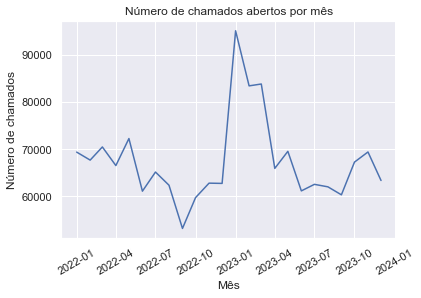

In [3]:
# seleção dos três bairros com mais chamados abertos
chamados_bairros_top3 = df['nome'].value_counts()[:3].index.tolist()

# criação de uma coluna informando o mês que o chamado foi aberto
df['data_inicio'] = pd.to_datetime(df['data_inicio'])
df['data_inicio_mes'] = df['data_inicio'].dt.to_period("M")

# contagem do número de chamados abertos por mês
chamados_por_bairro_df = df.groupby(['data_inicio_mes']) \
    .agg(chamados = ('data_inicio_mes', 'count')) \
    .reset_index() \
    .sort_values(['chamados'], ascending = False)

# tratamento da coluna data_inicio_mes
chamados_por_bairro_df['data_inicio_mes'] = chamados_por_bairro_df['data_inicio_mes'].dt.to_timestamp()

# plot do número de chamados abertos por mês
serie_hitorica_plot = sns.lineplot(x = 'data_inicio_mes',
                                   y = 'chamados',
                                   data = chamados_por_bairro_df)

# ajustes no gráfico
serie_hitorica_plot.set_xticklabels(serie_hitorica_plot.get_xticklabels(), rotation=30)
plt.xlabel('Mês')
plt.ylabel('Número de chamados')
plt.title('Número de chamados abertos por mês')

plt.show()

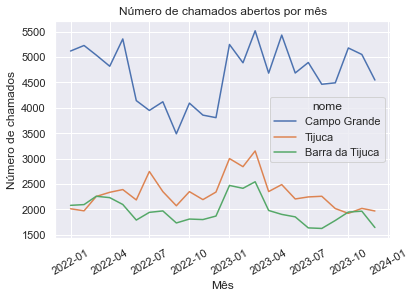

In [4]:
# contagem do número de chamados abertos por mês nos três bairros com mais chamados
chamados_por_bairro_top3_df = df[df['nome'].isin(chamados_bairros_top3)].groupby(['data_inicio_mes', 'nome']) \
    .agg(chamados = ('nome', 'count')) \
    .reset_index() \
    .sort_values(['chamados'], ascending = False)

# tratamento da coluna data_inicio_mes
chamados_por_bairro_top3_df['data_inicio_mes'] = chamados_por_bairro_top3_df['data_inicio_mes'].dt.to_timestamp()

# plot do número de chamados abertos por mês nos três bairros com mais chamados
serie_hitorica_bairros_top3_plot = sns.lineplot(x = 'data_inicio_mes', 
                                           y = 'chamados',
                                           hue = 'nome',
                                           data = chamados_por_bairro_top3_df)

# ajustes no gráfico
serie_hitorica_bairros_top3_plot.set_xticklabels(serie_hitorica_bairros_top3_plot.get_xticklabels(), rotation=30)
plt.xlabel('Mês')
plt.ylabel('Número de chamados')
plt.title('Número de chamados abertos por mês')
plt.show()

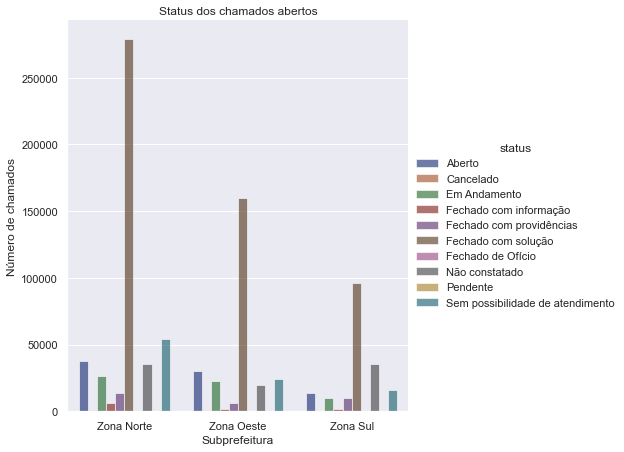

In [5]:
# seleção das três subprefeitura com mais chamados abertos
subprefeitura_chamados_top3 = df['subprefeitura'].value_counts()[:3].index.tolist()

# contagem do número de chamados abertos por subprefeitura
chamados_por_bairro_tipo_df = df[df['subprefeitura'].isin(subprefeitura_chamados_top3)].groupby(['subprefeitura', 'status']) \
    .agg(chamados = ('subprefeitura', 'count')) \
    .reset_index() 

# plot do status dos chamados abertos
g = sns.catplot(data = chamados_por_bairro_tipo_df, 
                kind="bar",
                x="subprefeitura",
                y="chamados", 
                hue="status",
                palette="dark", 
                alpha=.6, 
                height=6)

# ajustes no gráfico
plt.xlabel('Subprefeitura')
plt.ylabel('Número de chamados')
plt.title('Status dos chamados abertos')
plt.show()

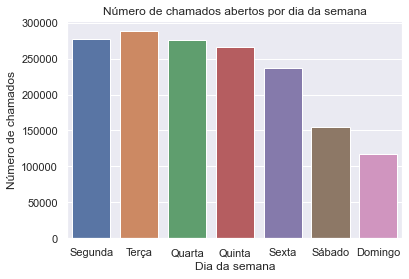

In [6]:
# criação de uma coluna representando o dia da semana que o chamado foi aberto
df['dia_semana'] = df['data_inicio'].dt.dayofweek

# contagem do número de chamados abertos em cada dia da semana
chamados_por_bairro_dia_semana_df = df.groupby(['dia_semana']) \
    .agg(chamados = ('dia_semana', 'count')) \
    .reset_index() 

# plot do número de chamados abertos por dia da semana
sns.barplot(x=chamados_por_bairro_dia_semana_df['dia_semana'],
            y=chamados_por_bairro_dia_semana_df['chamados'])

# ajustes no gráfico
plt.xticks(range(0, 7), labels = ['Segunda','Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo'])
plt.xlabel('Dia da semana')
plt.ylabel('Número de chamados')
plt.title('Número de chamados abertos por dia da semana')
plt.show()

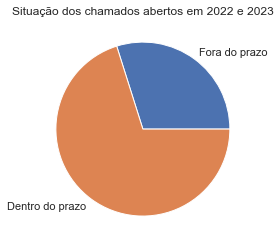

In [7]:
# contagem do número de chamados dentro e fora do prazo
chamados_por_prazo_df = df.groupby(['dentro_prazo']) \
    .agg(chamados = ('dentro_prazo', 'count')) \
    .reset_index() 

# tratamento da coluna dentro_prazo
chamados_por_prazo_df['dentro_prazo'].replace(0, 'Fora do prazo', inplace = True)
chamados_por_prazo_df['dentro_prazo'].replace(1, 'Dentro do prazo', inplace = True)

# plot da porcentagem de chamados dentro e fora do prazo
plt.pie(chamados_por_prazo_df['chamados'], 
        labels = chamados_por_prazo_df['dentro_prazo'])

# ajustes no gráfico
plt.title('Situação dos chamados abertos em 2022 e 2023')
plt.show()

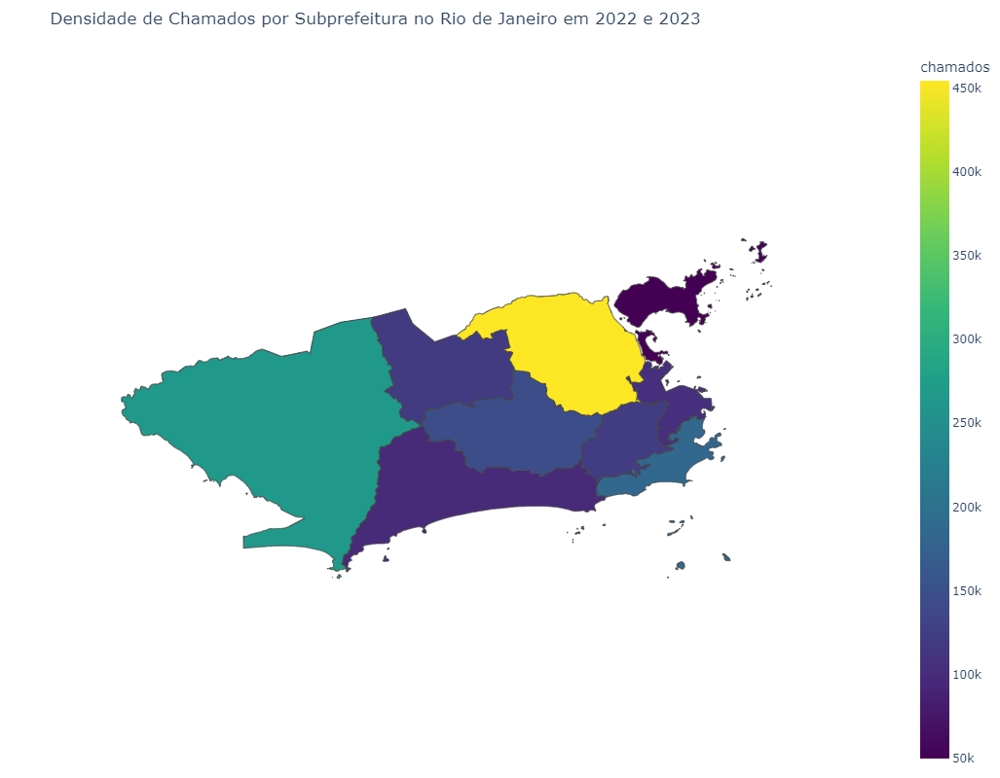

In [8]:
# coluna a ser considerada na agregação
agg_col = 'subprefeitura'
nome = 'Subprefeitura'

# contagem do número de chamados abertos em cada subprefeitura
densidade_chamados_df = df.groupby(agg_col) \
    .agg(chamados=('id_chamado', 'count'),
         no_prazo=('dentro_prazo', 'sum')) \
    .reset_index()

# leitura do arquivo geojson com os dados geoespaciais da cidade do Rio
cols = ['nome', 'nome_regiao_planejamento', 'nome_regiao_administrativa', 'subprefeitura']
dados_geoespaciais_df = gpd.read_file('bairros.geojson')

# merge entre os dados geoespaciais e a tabela de bairros
dados_geoespaciais_df = gpd.GeoDataFrame(dados_geoespaciais_df.merge(bairros_df[cols],
                                                                     left_on = 'NOME',
                                                                     right_on = 'nome'),
                                      geometry='geometry')

dados_geoespaciais_df = dados_geoespaciais_df.dissolve(by = agg_col).reset_index()

# merge entre os dados geoespaciais e a tabela de densidade de chamados
dados_final_df = pd.merge(dados_geoespaciais_df, densidade_chamados_df, on = agg_col, how = 'left')

# plot do mapa do Rio de Janeiro exibindo a densidade dos chamados
fig = px.choropleth(dados_final_df, 
                    geojson = dados_final_df.geometry, 
                    locations = dados_final_df.index, 
                    color = 'chamados',
                    color_continuous_scale = 'Viridis',
                    projection = "mercator",
                    labels = {'CHAMADOS':'Chamados'},
                    title = f'Densidade de Chamados por {nome} no Rio de Janeiro em 2022 e 2023'
                   )

# ajustes no gráfico
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(
    width = 1000,
    height = 800,
    margin = dict(l=0, r=0, t=50, b=10))
